In [1]:
# Seed value
# Apparently you may use different seed values at each stage
seed_value= 1
# 1. Set the `PYTHONHASHSEED` environment variable at a fixed value
import os
os.environ['PYTHONHASHSEED']=str(seed_value)
# 2. Set the `python` built-in pseudo-random generator at a fixed value
import random
random.seed(seed_value)
# 3. Set the `numpy` pseudo-random generator at a fixed value
import numpy as np
np.random.seed(seed_value)
# 4. Set the `tensorflow` pseudo-random generator at a fixed value
import tensorflow as tf
tf.compat.v1.set_random_seed(seed_value)

In [2]:
# Basic packages always been used
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Data scaling
from sklearn.preprocessing import MinMaxScaler

# Function for spilting training & testing data set
from sklearn.model_selection import train_test_split

# Tensorflow sequential models
from tensorflow import keras
from tensorflow.keras import backend as clear
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import GRU
from tensorflow.keras.layers import Dropout
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.optimizers import Adam

# Functions for evaluation
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from imblearn.metrics import sensitivity_score
from imblearn.metrics import specificity_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import mean_absolute_error #MAE
from sklearn.metrics import mean_squared_error #MSE,RMSE
from sklearn.metrics import mean_absolute_percentage_error #MAPE

In [3]:
import numpy as np
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
import tensorflow as tf
from tensorflow.keras.optimizers import Adam

In [4]:
data = pd.read_csv('/content/TSLA.csv')

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1259 entries, 0 to 1258
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       1259 non-null   object 
 1   Open       1259 non-null   float64
 2   High       1259 non-null   float64
 3   Low        1259 non-null   float64
 4   Close      1259 non-null   float64
 5   Adj Close  1259 non-null   float64
 6   Volume     1259 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 69.0+ KB


In [5]:
# 1.1 Convert date
data['Date']=pd.to_datetime(data.iloc[:,0])

data

,Date,Open,High,Low,Close,Adj Close,Volume
0,2013-01-02,2.333333,2.363333,2.314000,2.357333,2.357333,17922000
1,2013-01-03,2.345333,2.363333,2.316667,2.318000,2.318000,11130000
2,2013-01-04,2.320000,2.320000,2.261333,2.293333,2.293333,10110000
3,2013-01-07,2.320000,2.320000,2.260000,2.289333,2.289333,6630000
4,2013-01-08,2.300000,2.300000,2.207333,2.245333,2.245333,19260000
...,...,...,...,...,...,...,...
1254,2017-12-22,21.967333,22.061333,21.654667,21.680000,21.680000,63237000
1255,2017-12-26,21.588667,21.596001,21.105333,21.152666,21.152666,65676000
1256,2017-12-27,21.066668,21.178667,20.716667,20.775999,20.775999,70681500
1257,2017-12-28,20.783333,21.054667,20.636000,21.024000,21.024000,64744500


In [6]:
# Date is converted into special data type of pandas
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1259 entries, 0 to 1258
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       1259 non-null   datetime64[ns]
 1   Open       1259 non-null   float64       
 2   High       1259 non-null   float64       
 3   Low        1259 non-null   float64       
 4   Close      1259 non-null   float64       
 5   Adj Close  1259 non-null   float64       
 6   Volume     1259 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 69.0 KB


In [7]:
data.rename(columns={'Close': 'Y'}, inplace=True)
data = data.iloc[:, [0,4]]

data.head()

,Date,Y
0,2013-01-02,2.357333
1,2013-01-03,2.318000
2,2013-01-04,2.293333
3,2013-01-07,2.289333
4,2013-01-08,2.245333


In [8]:
# View descriptive statistics of target variable
# Pandas will automatically ignore date if the correct data type has been converted
data.describe()

,Y
count,1259.000000
mean,14.419571
std,5.055707
min,2.194000
25%,12.578000
50%,14.638667
75%,16.866999
max,25.666668


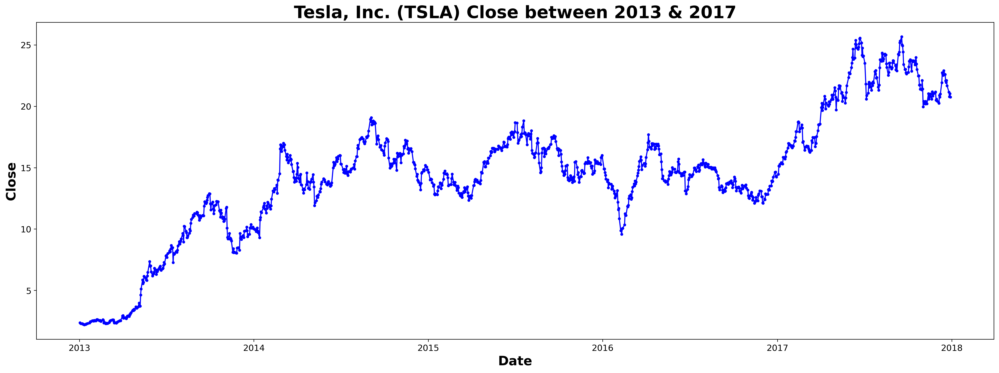

In [9]:
# Plot Y and its corresponding date
# Figure setting
plt.figure(figsize=(24,8),dpi=300)
plt.title('Tesla, Inc. (TSLA) Close between 2013 & 2017',weight='bold',fontsize=24)
plt.xlabel('Date',fontsize=18,weight='bold')
plt.ylabel('Close',fontsize=18,weight='bold')

# Actual by predicted plot
plt.plot(data['Date'],data['Y'],marker='.',color='blue')

# Set the axis
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

In [10]:
split =int(0.8*data.shape[0])
# Train,Test = data['Y'][0:split] , data['Y'][split:]
Train,Test = data.iloc[0:split,[1]], data.iloc[split:,[1]]
TestDate = data.iloc[split:,[0]]

val_split=int(0.8*Train.shape[0])
Train,Val=Train[0:val_split] , Train[val_split:]
# Val=Val.reset_index(drop=True)
# Test=Test.reset_index(drop=True)
Test

,Y
1007,14.246000
1008,14.466000
1009,15.132667
1010,15.116667
1011,15.267333
...,...
1254,21.680000
1255,21.152666
1256,20.775999
1257,21.024000


In [11]:
sc = MinMaxScaler(feature_range = (0, 1))
#需將資料做reshape的動作，使其shape為(資料長度,1)
train_set= Train.values.reshape(-1,1)
training_set_scaled = sc.fit_transform(train_set)
val_set= Val.values.reshape(-1,1)
val_set_scaled = sc.transform(val_set)
test_set = Test.values.reshape(-1,1)
test_set_scaled = sc.transform(test_set)
lags = 3

X_train = []
y_train = []
for i in range(lags,len(train_set)):
    X_train.append(training_set_scaled[i-lags:i])
    y_train.append(training_set_scaled[i])
X_train, y_train = np.array(X_train), np.array(y_train)
X_train = np.reshape(X_train,(X_train.shape[0], X_train.shape[1], 1))

X_val = []
y_val = []
for i in range(lags,len(val_set)):
    X_val.append(val_set_scaled[i-lags:i])
    y_val.append(val_set_scaled[i])
X_val, y_val = np.array(X_val), np.array(y_val)
X_val = np.reshape(X_val,(X_val.shape[0], X_val.shape[1], 1))

X_test = []
y_test = []
for i in range(lags,len(test_set)):
    X_test.append(test_set_scaled[i-lags:i])
    y_test.append(test_set_scaled[i])
X_test, y_test = np.array(X_test), np.array(y_test)
X_test = np.reshape(X_test,(X_test.shape[0], X_test.shape[1], 1))

In [12]:
X_train[0]

array([[0.0096788 ],
       [0.007348  ],
       [0.00588628]])

In [13]:
from keras.losses import mse
from keras.backend import sqrt

def my_RMSE(y_true, y_pred):
    return sqrt(mse(y_true, y_pred))

# Register custom object
#from keras.utils.generic_utils import get_custom_objects for pc
# from keras.utils.generic_utils import get_custom_objects
from tensorflow.keras.saving import get_custom_objects
get_custom_objects().update({'my_RMSE': my_RMSE})

In [14]:
# Symmetric Mean Absolute Percentage Error (SMAPE)
def SMAPE_calulate(y_true, y_pred):
    n = len(y_true)
    SMAPE=(100 / n) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_pred) + np.abs(y_true)))
    return SMAPE

# Relative Absolute Error (RAE)
def RAE_calculate(y_true, y_pred):
    abs_errors = np.abs(y_true - y_pred)
    denominator = np.sum(np.abs(y_true - np.mean(y_true)))
    RAE=np.sum(abs_errors/denominator)
    return RAE

# Mean Relative Absolute Error (MRAE)
def MRAE_calculate(y_true, y_pred):
    n=len(y_true)
    abs_errors = np.abs(y_true - y_pred)
    denominator = np.sum(np.abs(y_true - np.mean(y_true)))
    RAE=np.sum(abs_errors/denominator)
    MRAE=RAE/n
    return MRAE

# Median Relative Absolute Error (MdRAE) comparing with benchmark
# Note: By default, the bench value is the mean of actual value
def MdRAE_calculate(y_true, y_pred, bench=None):
    if bench==None:
        bench=np.mean(y_true)
        MdRAE=np.median(np.abs(y_true - y_pred)/np.abs(y_true - bench))
        return MdRAE,bench
    else:
        MdRAE=np.median(np.abs(y_true - y_pred)/np.abs(y_true - bench))
        return MdRAE

# Relative Squared Error (RSE) & Root Relative Squared Error (RRSE)
def RSE_calculate(y_true, y_pred, Root=False):
    mse = np.mean((y_true - y_pred)**2)
    denominator = np.var(y_true)
    RSE=mse/denominator

    if Root==True:
        return np.sqrt(RSE)
    else:
        return RSE

# DNN

In [16]:
# Tips: Using shape to call the amount of features in the data set
input_features=X_train.shape[1]
print('Amount of features:',input_features)

Amount of features: 3


## Sequential style coding for creating net

In [129]:
# 十層
clear.clear_session()

model = Sequential()

model.add(Dense(units=6, input_dim=3, activation='relu'))

model.add(Dense(units=12, activation='relu'))

model.add(Dense(units=24, activation='relu'))

model.add(Dense(units=48, activation='relu'))

model.add(Dense(units=96, activation='relu'))

model.add(Dense(units=192, activation='relu'))

model.add(Dense(units=192*2, activation='relu'))

model.add(Dense(units=192*4, activation='relu'))

model.add(Dense(units=192*4, activation='relu'))

model.add(Dense(units=192*2, activation='relu'))

model.add(Dense(units=1, activation='linear'))


opt = Adam(learning_rate=0.0000089, beta_1=0.97)

model.compile(loss='my_RMSE', optimizer=opt, metrics=['mean_absolute_percentage_error'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 6)                 24        
                                                                 
 dense_1 (Dense)             (None, 12)                84        
                                                                 
 dense_2 (Dense)             (None, 24)                312       
                                                                 
 dense_3 (Dense)             (None, 48)                1200      
                                                                 
 dense_4 (Dense)             (None, 96)                4704      
                                                                 
 dense_5 (Dense)             (None, 192)               18624     
                                                                 
 dense_6 (Dense)             (None, 384)               7

In [100]:
# 十一層
clear.clear_session()

model = Sequential()

model.add(Dense(units=6, input_dim=3, activation='relu'))

model.add(Dense(units=12, activation='relu'))

model.add(Dense(units=24, activation='relu'))

model.add(Dense(units=48, activation='relu'))

model.add(Dense(units=96, activation='relu'))

model.add(Dense(units=192, activation='relu'))

model.add(Dense(units=192*2, activation='relu'))

model.add(Dense(units=192*4, activation='relu'))

model.add(Dense(units=192*8, activation='relu'))

model.add(Dense(units=192*4, activation='relu'))

model.add(Dense(units=192*2, activation='relu'))

model.add(Dense(units=1, activation='linear'))


opt = Adam(learning_rate=0.0000085, beta_1=0.93)
model.compile(loss='my_RMSE', optimizer=opt, metrics=['mean_absolute_percentage_error'])


model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 6)                 24        
                                                                 
 dense_1 (Dense)             (None, 12)                84        
                                                                 
 dense_2 (Dense)             (None, 24)                312       
                                                                 
 dense_3 (Dense)             (None, 48)                1200      
                                                                 
 dense_4 (Dense)             (None, 96)                4704      
                                                                 
 dense_5 (Dense)             (None, 192)               18624     
                                                                 
 dense_6 (Dense)             (None, 384)               7

In [52]:
# 十二層
clear.clear_session()

model = Sequential()

model.add(Dense(units=6, input_dim=3, activation='relu'))

model.add(Dense(units=12, activation='relu'))

model.add(Dense(units=24, activation='relu'))

model.add(Dense(units=48, activation='relu'))

model.add(Dense(units=96, activation='relu'))

model.add(Dense(units=192, activation='relu'))

model.add(Dense(units=192*2, activation='relu'))

model.add(Dense(units=192*4, activation='relu'))

model.add(Dense(units=192*8, activation='relu'))

model.add(Dense(units=192*8, activation='relu'))

model.add(Dense(units=192*4, activation='relu'))

model.add(Dense(units=192*2, activation='relu'))

model.add(Dense(units=1, activation='linear'))

opt = Adam(learning_rate=0.0000085, beta_1=0.93)

model.compile(loss='my_RMSE', optimizer=opt, metrics=['mean_absolute_percentage_error'])


model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 6)                 24        
                                                                 
 dense_1 (Dense)             (None, 12)                84        
                                                                 
 dense_2 (Dense)             (None, 24)                312       
                                                                 
 dense_3 (Dense)             (None, 48)                1200      
                                                                 
 dense_4 (Dense)             (None, 96)                4704      
                                                                 
 dense_5 (Dense)             (None, 192)               18624     
                                                                 
 dense_6 (Dense)             (None, 384)               7

## Fit the model (train/validation)

In [53]:
# Fit model
history = model.fit(X_train, y_train, epochs = 100, batch_size = 64,validation_data=(X_val,y_val))

Epoch 1/100
13/13 [==============================] - 7s 27ms/step - loss: 0.6028 - mean_absolute_percentage_error: 346.3434 - val_loss: 0.7062 - val_mean_absolute_percentage_error: 98.4334
Epoch 2/100
13/13 [==============================] - 0s 8ms/step - loss: 0.5937 - mean_absolute_percentage_error: 6985.5479 - val_loss: 0.6959 - val_mean_absolute_percentage_error: 97.0015
Epoch 3/100
13/13 [==============================] - 0s 9ms/step - loss: 0.5836 - mean_absolute_percentage_error: 12330.9375 - val_loss: 0.6831 - val_mean_absolute_percentage_error: 95.2088
Epoch 4/100
13/13 [==============================] - 0s 12ms/step - loss: 0.5705 - mean_absolute_percentage_error: 20408.0176 - val_loss: 0.6655 - val_mean_absolute_percentage_error: 92.7342
Epoch 5/100
13/13 [==============================] - 0s 12ms/step - loss: 0.5529 - mean_absolute_percentage_error: 26716.0898 - val_loss: 0.6413 - val_mean_absolute_percentage_error: 89.3562
Epoch 6/100
13/13 [==============================]

In [54]:
modeling_result=history.history
modeling_result.keys()

dict_keys(['loss', 'mean_absolute_percentage_error', 'val_loss', 'val_mean_absolute_percentage_error'])

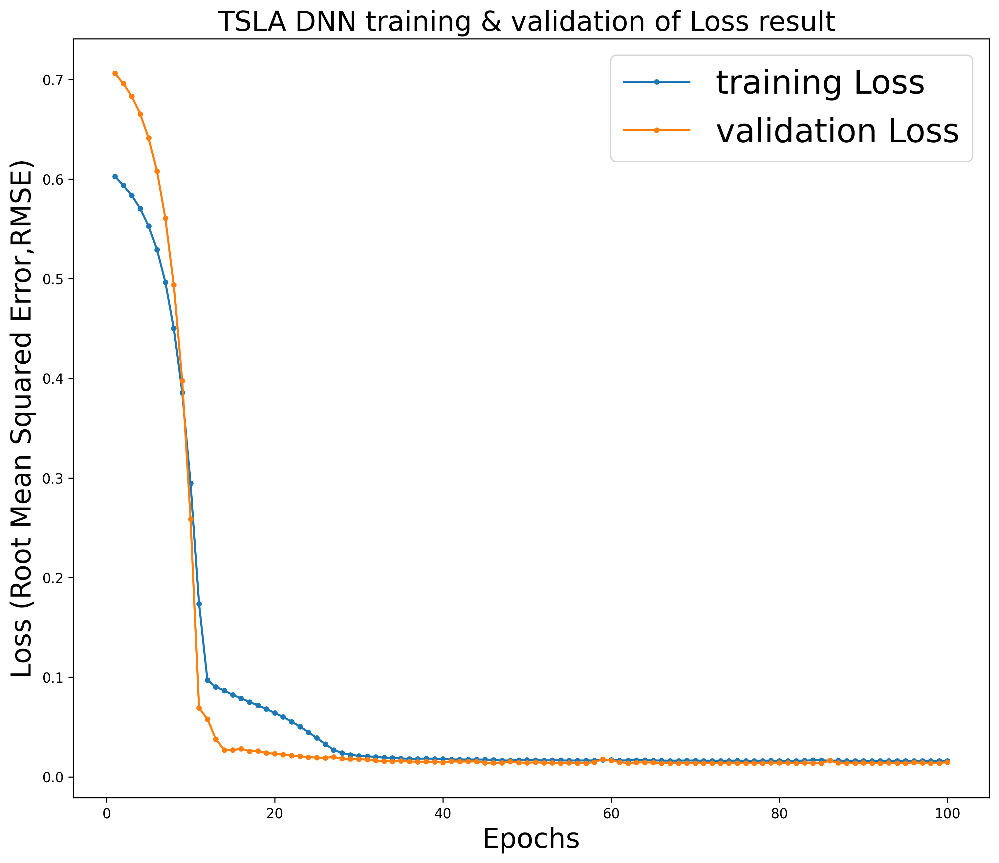

In [55]:
# Plot the history of training and validation
training_loss_values=modeling_result['loss']
val_loss_values=modeling_result['val_loss']
epochs=range(1,len(training_loss_values)+1)

plt.figure(figsize=(12,10),dpi=300)
plt.xlabel('Epochs',fontsize=20)
plt.ylabel('Loss (Root Mean Squared Error,RMSE)',fontsize=20)
plt.title('TSLA DNN training & validation of Loss result ',fontsize=20)

plt.plot(epochs, training_loss_values,marker='.',label='training Loss')
plt.plot(epochs, val_loss_values,marker='.',label='validation Loss')
plt.legend(loc=1,fontsize=24)
plt.show()

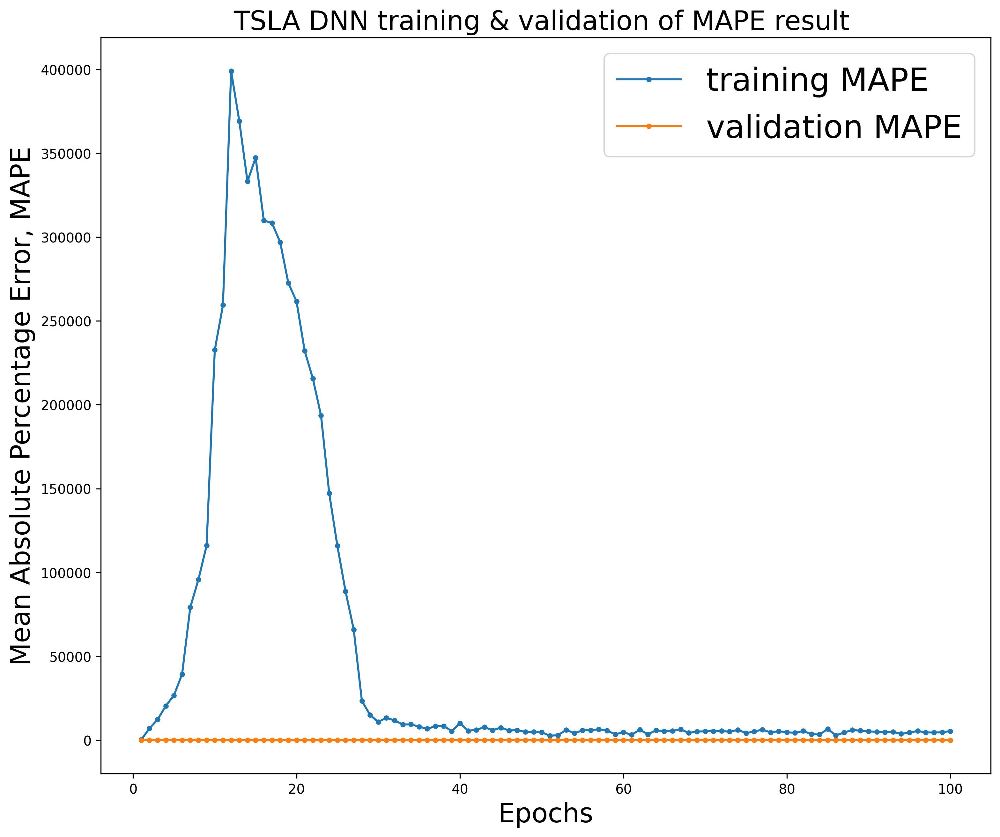

In [56]:
# Plot the history of training and validation
training_acc_values=modeling_result['mean_absolute_percentage_error']
val_acc_values=modeling_result['val_mean_absolute_percentage_error']
epochs=range(1,len(training_acc_values)+1)

plt.figure(figsize=(12,10),dpi=300)
plt.xlabel('Epochs',fontsize=20)
plt.ylabel('Mean Absolute Percentage Error, MAPE',fontsize=20)
plt.title('TSLA DNN training & validation of MAPE result ',fontsize=20)

plt.plot(epochs, training_acc_values,marker='.',label='training MAPE')
plt.plot(epochs, val_acc_values,marker='.',label='validation MAPE')
plt.legend(loc=1,fontsize=24)
plt.show()

In [69]:
model.save('DNN_trained_model_12.h5')
print('Model has been saved...')

Model has been saved...


In [16]:
DNN_model=keras.models.load_model('/content/DNN_trained_model_12.h5')
print('Model successfully loaded...')

Model successfully loaded...


## Testing

In [17]:
# Predict
predicted_price = DNN_model.predict(X_test)
#使用sc的 inverse_transform將股價轉為歸一化前
predicted_price = sc.inverse_transform(predicted_price)
actual_price = sc.inverse_transform(y_test)

8/8 [==============================] - 1s 16ms/step


In [18]:
DNN_df1 = pd.DataFrame(predicted_price)
df2 = pd.DataFrame(actual_price)

DNN_df1.columns = ['Pred']
df2.columns = ['Actual']

merged_df = pd.concat([DNN_df1, df2], axis=1)
merged_df.to_csv('output.csv', index=False)

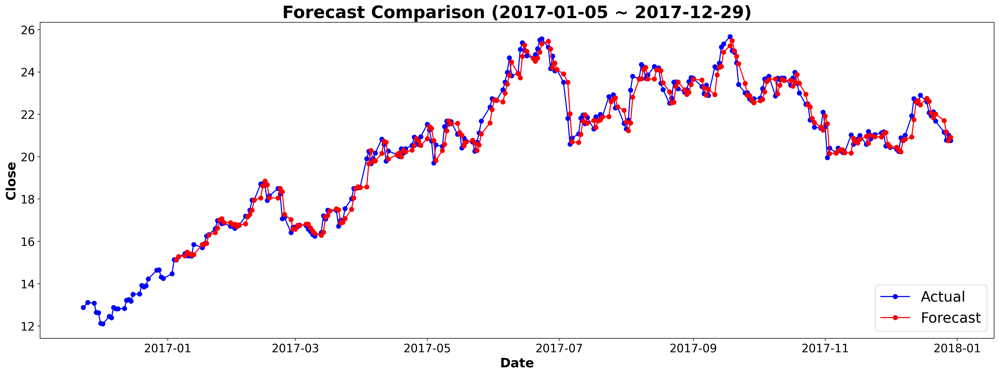

In [63]:
# Plot Y and its corresponding date
# Figure setting
plt.figure(figsize=(24,8),dpi=300)
plt.title('Forecast Comparison (2017-01-05 ~ 2017-12-29)',weight='bold',fontsize=24)
plt.xlabel('Date',fontsize=18,weight='bold')
plt.ylabel('Close',fontsize=18,weight='bold')

# Comparison of actual value and predicted value according to Date
plt.plot(data.iloc[982:,0],data.iloc[982:,1],marker='o',color='blue',label='Actual')
plt.plot(data.iloc[split+lags:,0],DNN_df1,marker='o',color='red',label='Forecast')

# Set the axis
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Set legends
plt.legend(loc=4,fontsize=20)

plt.show()

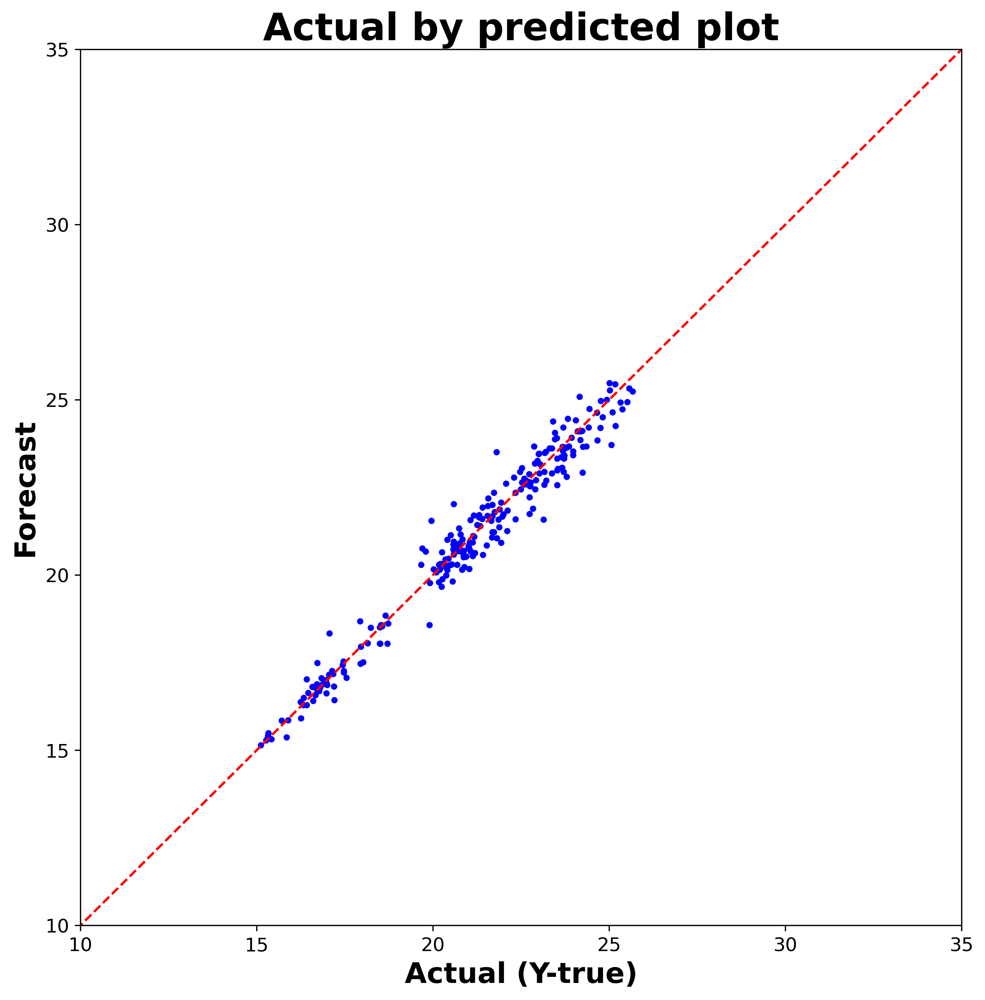

In [20]:
# Lock the scale of axis by Y_true
# max_value=100+5
# min_value=0-5
max_value=35
min_value=0

# Figure setting
plt.figure(figsize=(10,10),dpi=300)
plt.title('Actual by predicted plot',weight='bold',fontsize=24)
plt.xlabel('Actual (Y-true)',fontsize=18,weight='bold')
plt.ylabel('Forecast',fontsize=18,weight='bold')

# Perfect model reference line
plt.plot([min_value,max_value], [min_value,max_value], linestyle='--',color='red')

# Actual by predicted plot
plt.scatter(df2,DNN_df1,marker='.',color='blue')

# Set the axis
plt.ylim(10,max_value)
plt.xlim(10,max_value)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

In [21]:
predicted_price
actual_price

MAE=mean_absolute_error(actual_price,predicted_price)
MSE=mean_squared_error(actual_price,predicted_price,squared=True)
RMSE=mean_squared_error(actual_price,predicted_price,squared=False)
# MAPE=mean_absolute_percentage_error(actual_price,predicted_price)
SMAPE=SMAPE_calulate(actual_price,predicted_price)
# RAE=RAE_calculate(actual_price,predicted_price)
# MRAE=MRAE_calculate(actual_price,predicted_price)
MdRAE=MdRAE_calculate(actual_price,predicted_price)
# RSE=RSE_calculate(actual_price,predicted_price,Root=False)
# RRSE=RSE_calculate(actual_price,predicted_price,Root=True)

print('MAE:',round(MAE,3))
print('MSE:',round(MSE,3))
print('RMSE:',round(RMSE,3))
# print('MAPE:',round(MAPE*100,3),'%')
print('SMAPE:',round(SMAPE,3),'%')
# print('RAE:',round(RAE,3))
# print('MRAE:',MRAE)
print('MdRAE:',round(MdRAE[0],3),'bench:',round(MdRAE[1],3))
# print('RSE:',round(RSE,3))
# print('RRSE:',round(RRSE,3))

MAE: 0.352
MSE: 0.229
RMSE: 0.479
SMAPE: 1.655 %
MdRAE: 0.152 bench: 21.004


# Simple RNN

# Fit & compile the model

In [20]:
keras.backend.clear_session()
# Build RNN+DNN Model
model = Sequential()
model.add(layers.SimpleRNN(20,
            input_shape=(3, 1),
            activation='linear'))
model.add(Dense(units=1, activation='linear'))
model.summary()

# Compile Model
opt=Adam(learning_rate=0.005,beta_1=0.99)
model.compile(loss='my_RMSE', optimizer=opt, metrics=['mean_absolute_percentage_error'])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn (SimpleRNN)      (None, 20)                440       
                                                                 
 dense (Dense)               (None, 1)                 21        
                                                                 
Total params: 461
Trainable params: 461
Non-trainable params: 0
_________________________________________________________________


In [21]:
# Fit model
history = model.fit(X_train, y_train, epochs = 100, batch_size = 64,validation_data=(X_val,y_val))

Epoch 1/100
13/13 [==============================] - 2s 27ms/step - loss: 0.2535 - mean_absolute_percentage_error: 60637.7266 - val_loss: 0.1921 - val_mean_absolute_percentage_error: 26.6264
Epoch 2/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1457 - mean_absolute_percentage_error: 23572.6016 - val_loss: 0.1014 - val_mean_absolute_percentage_error: 14.3008
Epoch 3/100
13/13 [==============================] - 0s 7ms/step - loss: 0.1058 - mean_absolute_percentage_error: 12177.8564 - val_loss: 0.0358 - val_mean_absolute_percentage_error: 4.9892
Epoch 4/100
13/13 [==============================] - 0s 7ms/step - loss: 0.0921 - mean_absolute_percentage_error: 65951.3594 - val_loss: 0.0728 - val_mean_absolute_percentage_error: 10.1227
Epoch 5/100
13/13 [==============================] - 0s 7ms/step - loss: 0.0575 - mean_absolute_percentage_error: 51393.8750 - val_loss: 0.1005 - val_mean_absolute_percentage_error: 14.1384
Epoch 6/100
13/13 [==============================]

In [22]:
modeling_result=history.history
modeling_result.keys()

dict_keys(['loss', 'mean_absolute_percentage_error', 'val_loss', 'val_mean_absolute_percentage_error'])

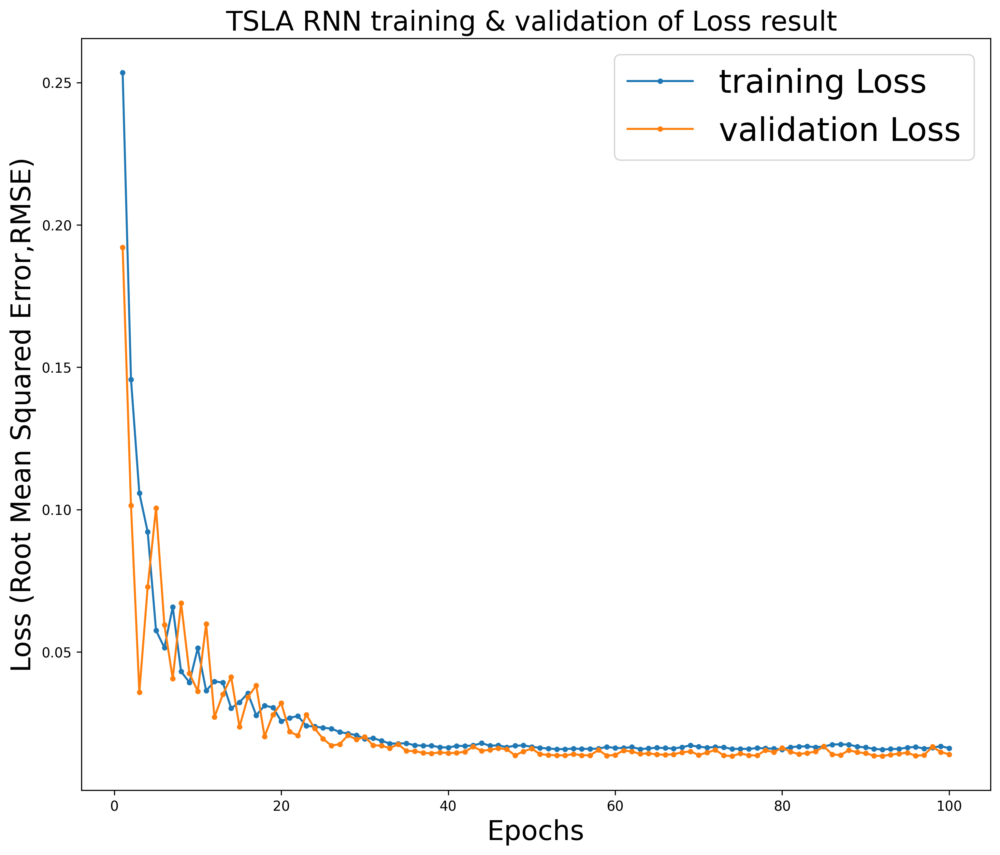

In [23]:
# Plot the history of training and validation
training_loss_values=modeling_result['loss']
val_loss_values=modeling_result['val_loss']
epochs=range(1,len(training_loss_values)+1)

plt.figure(figsize=(12,10),dpi=300)
plt.xlabel('Epochs',fontsize=20)
plt.ylabel('Loss (Root Mean Squared Error,RMSE)',fontsize=20)
plt.title('TSLA RNN training & validation of Loss result ',fontsize=20)

plt.plot(epochs, training_loss_values,marker='.',label='training Loss')
plt.plot(epochs, val_loss_values,marker='.',label='validation Loss')
plt.legend(loc=1,fontsize=24)
plt.show()

In [ ]:
model.save('RNN_trained_model.h5')
print('Model has been saved...')

Model has been saved...


In [22]:
RNN_model=keras.models.load_model('/content/RNN_trained_model.h5')
print('Model successfully loaded...')

Model successfully loaded...


# Testing

In [23]:
# Predict
predicted_price = RNN_model.predict(X_test)
#使用sc的 inverse_transform將股價轉為歸一化前
predicted_price = sc.inverse_transform(predicted_price)
actual_price = sc.inverse_transform(y_test)

8/8 [==============================] - 0s 2ms/step


In [24]:
RNN_df1 = pd.DataFrame(predicted_price)
df2 = pd.DataFrame(actual_price)

RNN_df1.columns = ['Pred']
df2.columns = ['Actual']

merged_df = pd.concat([RNN_df1, df2], axis=1)
merged_df.to_csv('output.csv', index=False)

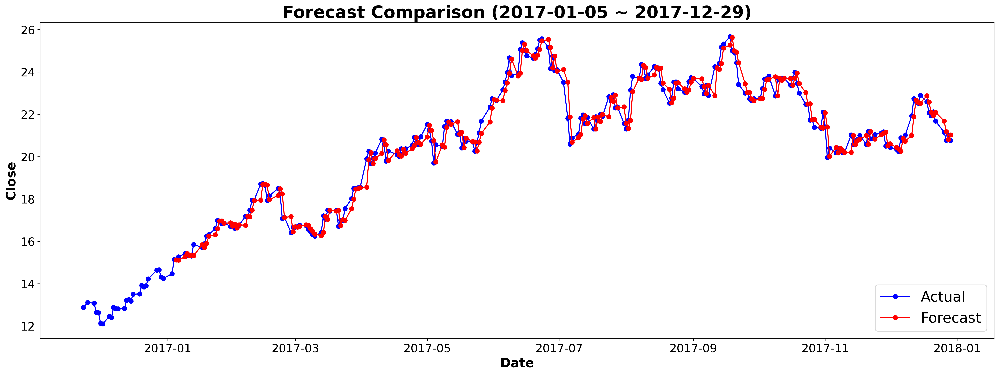

In [64]:
# Plot Y and its corresponding date
# Figure setting
plt.figure(figsize=(24,8),dpi=300)
plt.title('Forecast Comparison (2017-01-05 ~ 2017-12-29)',weight='bold',fontsize=24)
plt.xlabel('Date',fontsize=18,weight='bold')
plt.ylabel('Close',fontsize=18,weight='bold')

# Comparison of actual value and predicted value according to Date
plt.plot(data.iloc[982:,0],data.iloc[982:,1],marker='o',color='blue',label='Actual')
plt.plot(data.iloc[split+lags:,0],RNN_df1,marker='o',color='red',label='Forecast')

# Set the axis
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Set legends
plt.legend(loc=4,fontsize=20)

plt.show()

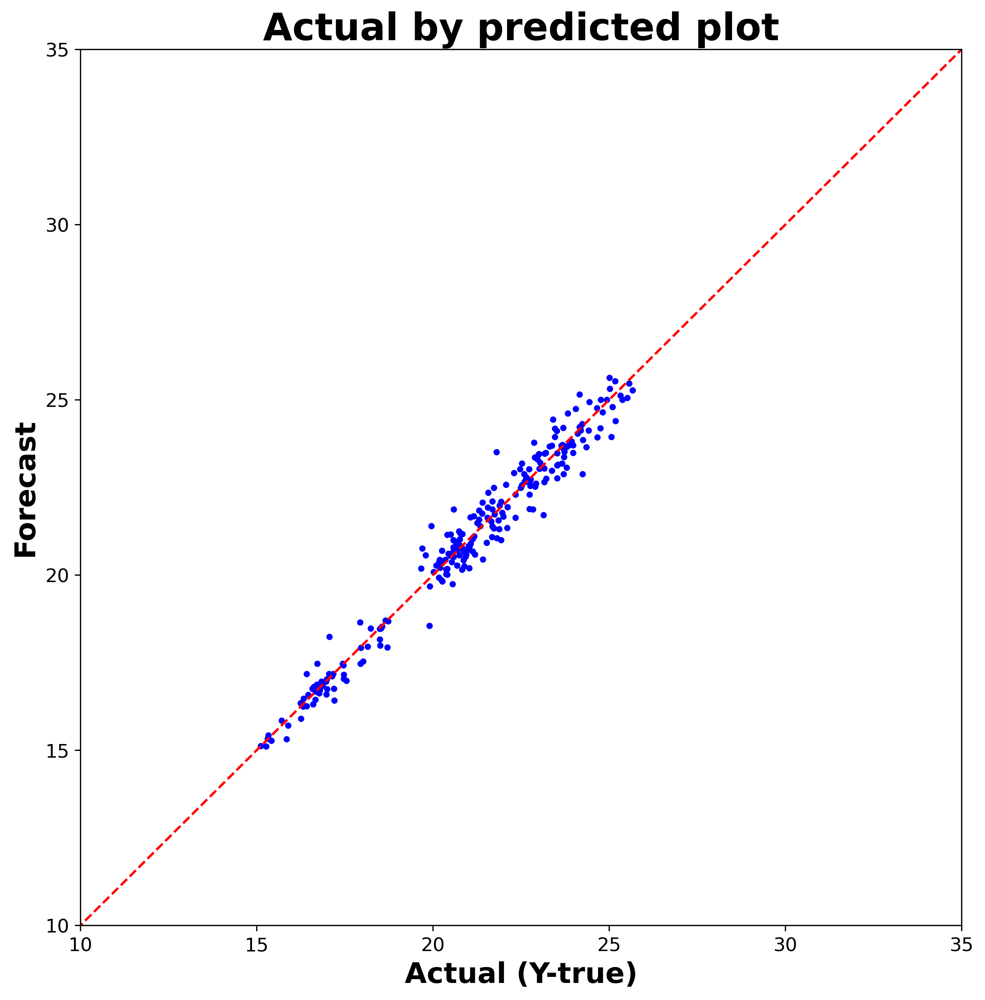

In [26]:
# Lock the scale of axis by Y_true
# max_value=100+5
# min_value=0-5
max_value=35
min_value=0

# Figure setting
plt.figure(figsize=(10,10),dpi=300)
plt.title('Actual by predicted plot',weight='bold',fontsize=24)
plt.xlabel('Actual (Y-true)',fontsize=18,weight='bold')
plt.ylabel('Forecast',fontsize=18,weight='bold')

# Perfect model reference line
plt.plot([min_value,max_value], [min_value,max_value], linestyle='--',color='red')

# Actual by predicted plot
plt.scatter(df2,RNN_df1,marker='.',color='blue')

# Set the axis
plt.ylim(10,max_value)
plt.xlim(10,max_value)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

In [27]:
predicted_price
actual_price

MAE=mean_absolute_error(actual_price,predicted_price)
MSE=mean_squared_error(actual_price,predicted_price,squared=True)
RMSE=mean_squared_error(actual_price,predicted_price,squared=False)
# MAPE=mean_absolute_percentage_error(actual_price,predicted_price)
SMAPE=SMAPE_calulate(actual_price,predicted_price)
# RAE=RAE_calculate(actual_price,predicted_price)
# MRAE=MRAE_calculate(actual_price,predicted_price)
MdRAE=MdRAE_calculate(actual_price,predicted_price)
# RSE=RSE_calculate(actual_price,predicted_price,Root=False)
# RRSE=RSE_calculate(actual_price,predicted_price,Root=True)

print('MAE:',round(MAE,3))
print('MSE:',round(MSE,3))
print('RMSE:',round(RMSE,3))
# print('MAPE:',round(MAPE*100,3),'%')
print('SMAPE:',round(SMAPE,3),'%')
# print('RAE:',round(RAE,3))
# print('MRAE:',MRAE)
print('MdRAE:',round(MdRAE[0],3),'bench:',round(MdRAE[1],3))
# print('RSE:',round(RSE,3))
# print('RRSE:',round(RRSE,3))

MAE: 0.352
MSE: 0.223
RMSE: 0.472
SMAPE: 1.663 %
MdRAE: 0.168 bench: 21.004


# Naive

In [28]:
# Naive
predicted_price = data['Y'][split+lags-1:-1].values.reshape(-1,1)
actual_price = sc.inverse_transform(y_test)

MAE=mean_absolute_error(actual_price,predicted_price)
MSE=mean_squared_error(actual_price,predicted_price,squared=True)
RMSE=mean_squared_error(actual_price,predicted_price,squared=False)
SMAPE=SMAPE_calulate(actual_price,predicted_price)
MdRAE=MdRAE_calculate(actual_price,predicted_price)

print('MAE:',round(MAE,3))
print('MSE:',round(MSE,3))
print('RMSE:',round(RMSE,3))
print('SMAPE:',round(SMAPE,3),'%')
print('MdRAE:',round(MdRAE[0],3),'bench:',round(MdRAE[1],3))

MAE: 0.353
MSE: 0.222
RMSE: 0.471
SMAPE: 1.665 %
MdRAE: 0.165 bench: 21.004


In [29]:
# Naive
Naive_df1 = pd.DataFrame(predicted_price)
df2 = pd.DataFrame(actual_price)

Naive_df1.columns = ['Pred']
df2.columns = ['Actual']

merged_df = pd.concat([Naive_df1, df2], axis=1)
merged_df.to_csv('Naive_output.csv', index=False)

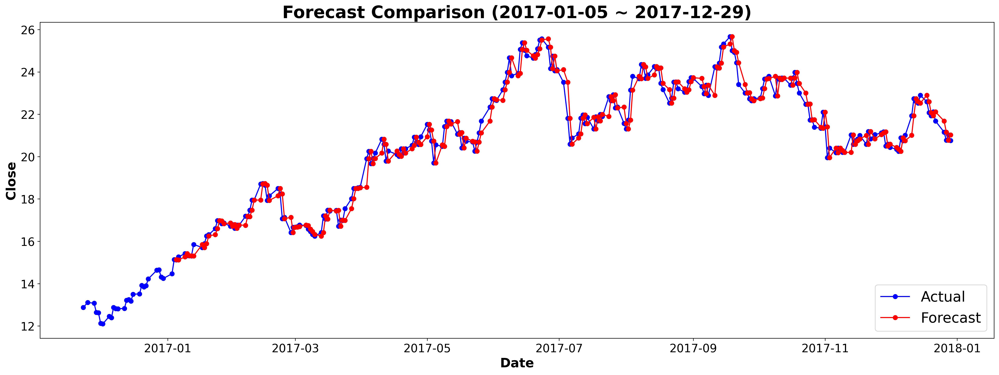

In [66]:
# Plot Y and its corresponding date
# Figure setting
plt.figure(figsize=(24,8),dpi=300)
plt.title('Forecast Comparison (2017-01-05 ~ 2017-12-29)',weight='bold',fontsize=24)
plt.xlabel('Date',fontsize=18,weight='bold')
plt.ylabel('Close',fontsize=18,weight='bold')

# Comparison of actual value and predicted value according to Date
plt.plot(data.iloc[982:,0],data.iloc[982:,1],marker='o',color='blue',label='Actual')
plt.plot(data.iloc[split+lags:,0],Naive_df1,marker='o',color='red',label='Forecast')

# Set the axis
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Set legends
plt.legend(loc=4,fontsize=20)

plt.show()

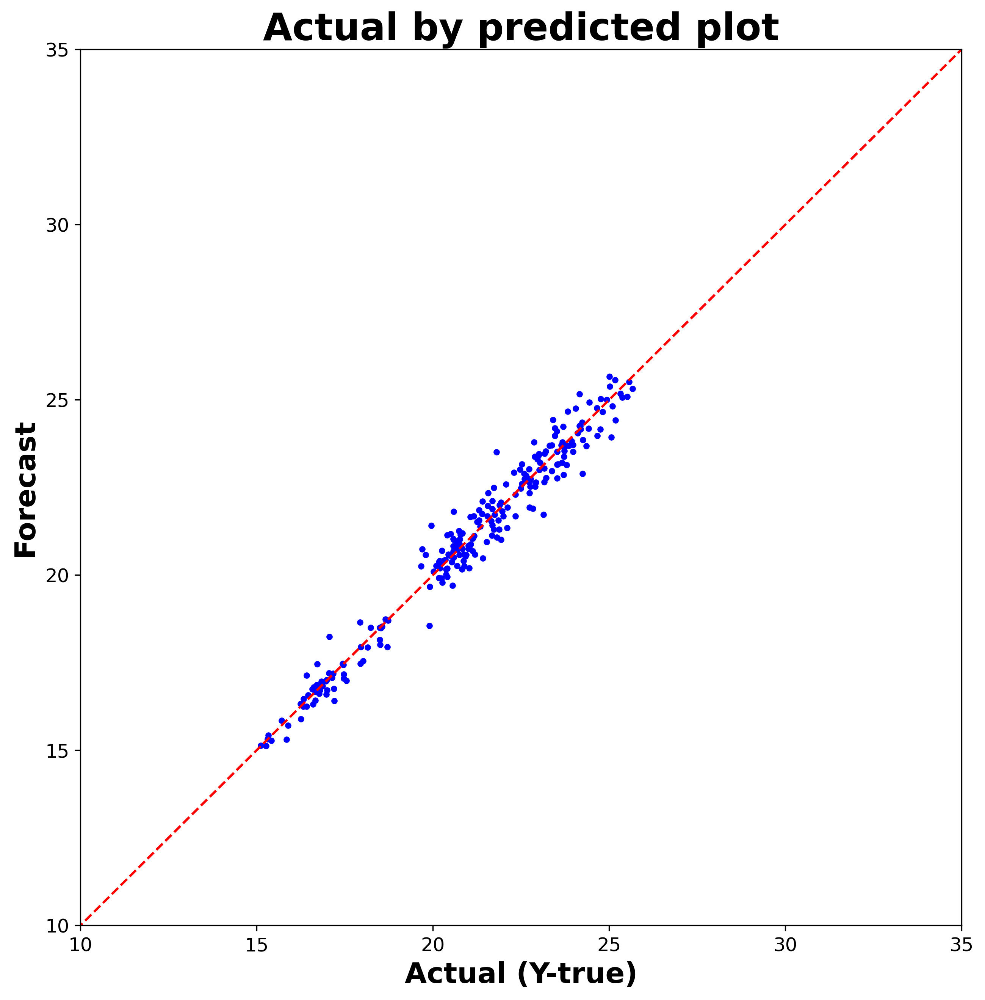

In [119]:
# Lock the scale of axis by Y_true
# max_value=100+5
# min_value=0-5
max_value=35
min_value=0

# Figure setting
plt.figure(figsize=(10,10),dpi=300)
plt.title('Actual by predicted plot',weight='bold',fontsize=24)
plt.xlabel('Actual (Y-true)',fontsize=18,weight='bold')
plt.ylabel('Forecast',fontsize=18,weight='bold')

# Perfect model reference line
plt.plot([min_value,max_value], [min_value,max_value], linestyle='--',color='red')

# Actual by predicted plot
plt.scatter(df2,Naive_df1,marker='.',color='blue')

# Set the axis
plt.ylim(10,max_value)
plt.xlim(10,max_value)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

# LSTM

## Build model & Compile & Fit

In [103]:
# 一層
keras.backend.clear_session()
model = Sequential()
model.add(LSTM(units = 64,input_shape = (X_train.shape[1], 1)))
model.add(Dense(1,activation='linear'))
model.summary()
opt=Adam(learning_rate=0.008,beta_1=0.99)
model.compile(loss='my_RMSE', optimizer=opt, metrics=['mean_absolute_percentage_error'])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 64)                16896     
                                                                 
 dense (Dense)               (None, 1)                 65        
                                                                 
Total params: 16,961
Trainable params: 16,961
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# 兩層
keras.backend.clear_session()
model = Sequential()
model.add(LSTM(32, input_shape=(X_train.shape[1], 1), return_sequences = True))
model.add(LSTM(16))
model.add(Dense(1,activation='linear'))
model.summary()
opt=Adam(learning_rate=0.01,beta_1=0.99)
model.compile(loss='my_RMSE', optimizer=opt, metrics=['mean_absolute_percentage_error'])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 3, 32)             4352      
                                                                 
 lstm_1 (LSTM)               (None, 16)                3136      
                                                                 
 dense (Dense)               (None, 1)                 17        
                                                                 
Total params: 7,505
Trainable params: 7,505
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# 三層
keras.backend.clear_session()
model = Sequential()
model.add(LSTM(64, input_shape=(X_train.shape[1], 1), return_sequences = True))
model.add(LSTM(48,activation='relu', return_sequences = True))
model.add(LSTM(32,activation='relu'))
model.add(Dense(1,activation='linear'))
model.summary()
opt=Adam(learning_rate=0.01,beta_1=0.9)
model.compile(loss='my_RMSE', optimizer=opt, metrics=['mean_absolute_percentage_error'])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 3, 64)             16896     
                                                                 
 lstm_1 (LSTM)               (None, 3, 48)             21696     
                                                                 
 lstm_2 (LSTM)               (None, 32)                10368     
                                                                 
 dense (Dense)               (None, 1)                 33        
                                                                 
Total params: 48,993
Trainable params: 48,993
Non-trainable params: 0
_________________________________________________________________


## Plot the history of training and validation

In [104]:
history = model.fit(X_train, y_train, epochs = 100, batch_size = 64,validation_data=(X_val,y_val))

Epoch 1/100
13/13 [==============================] - 5s 99ms/step - loss: 0.2442 - mean_absolute_percentage_error: 61654.4727 - val_loss: 0.1862 - val_mean_absolute_percentage_error: 25.7269
Epoch 2/100
13/13 [==============================] - 0s 16ms/step - loss: 0.1405 - mean_absolute_percentage_error: 199816.8125 - val_loss: 0.1327 - val_mean_absolute_percentage_error: 18.9123
Epoch 3/100
13/13 [==============================] - 0s 14ms/step - loss: 0.1039 - mean_absolute_percentage_error: 248256.7188 - val_loss: 0.1323 - val_mean_absolute_percentage_error: 18.2461
Epoch 4/100
13/13 [==============================] - 0s 17ms/step - loss: 0.0827 - mean_absolute_percentage_error: 126807.6641 - val_loss: 0.0948 - val_mean_absolute_percentage_error: 13.4951
Epoch 5/100
13/13 [==============================] - 0s 13ms/step - loss: 0.0628 - mean_absolute_percentage_error: 164735.3750 - val_loss: 0.0938 - val_mean_absolute_percentage_error: 12.9882
Epoch 6/100
13/13 [======================

In [105]:
modeling_result=history.history
modeling_result.keys()

dict_keys(['loss', 'mean_absolute_percentage_error', 'val_loss', 'val_mean_absolute_percentage_error'])

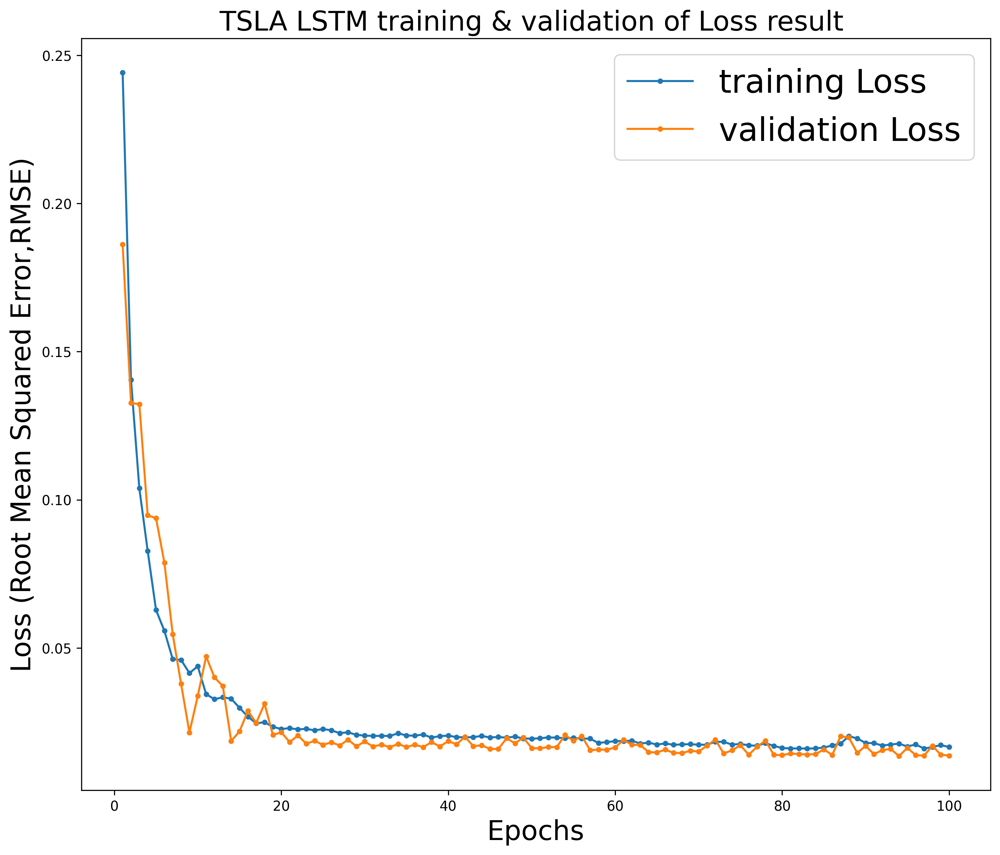

In [106]:
# Plot the history of training and validation
training_loss_values=modeling_result['loss']
val_loss_values=modeling_result['val_loss']
epochs=range(1,len(training_loss_values)+1)

plt.figure(figsize=(12,10),dpi=300)
plt.xlabel('Epochs',fontsize=20)
plt.ylabel('Loss (Root Mean Squared Error,RMSE)',fontsize=20)
plt.title('TSLA LSTM training & validation of Loss result ',fontsize=20)

plt.plot(epochs, training_loss_values,marker='.',label='training Loss')
plt.plot(epochs, val_loss_values,marker='.',label='validation Loss')
plt.legend(loc=1,fontsize=24)
plt.show()

In [ ]:
model.save('RNN_LSTM_trained_model.h5')
print('Model has been saved...')

Model has been saved...


In [30]:
LSTM_model=keras.models.load_model('/content/RNN_LSTM_trained_model.h5')
print('Model successfully loaded...')

Model successfully loaded...


## Testing

In [31]:
predicted_price = LSTM_model.predict(X_test)
#使用sc的 inverse_transform將股價轉為歸一化前
predicted_price = sc.inverse_transform(predicted_price)
actual_price = sc.inverse_transform(y_test)

8/8 [==============================] - 0s 3ms/step


In [32]:
LSTM_df1 = pd.DataFrame(predicted_price)
df2 = pd.DataFrame(actual_price)

LSTM_df1.columns = ['Pred']
df2.columns = ['Actual']

merged_df = pd.concat([LSTM_df1, df2], axis=1)
merged_df.to_csv('output2.csv', index=False)

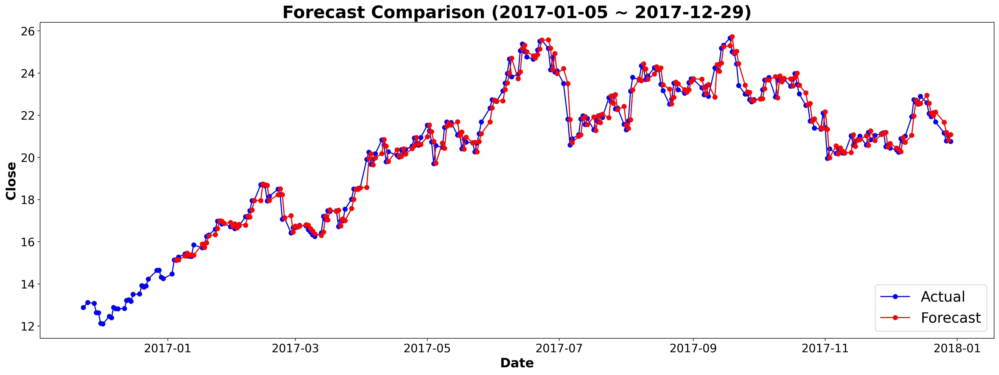

In [67]:
# Plot Y and its corresponding date
# Figure setting
plt.figure(figsize=(24,8),dpi=300)
plt.title('Forecast Comparison (2017-01-05 ~ 2017-12-29)',weight='bold',fontsize=24)
plt.xlabel('Date',fontsize=18,weight='bold')
plt.ylabel('Close',fontsize=18,weight='bold')

# Comparison of actual value and predicted value according to Date
plt.plot(data.iloc[982:,0],data.iloc[982:,1],marker='o',color='blue',label='Actual')
plt.plot(data.iloc[split+lags:,0],LSTM_df1,marker='o',color='red',label='Forecast')

# Set the axis
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Set legends
plt.legend(loc=4,fontsize=20)

plt.show()

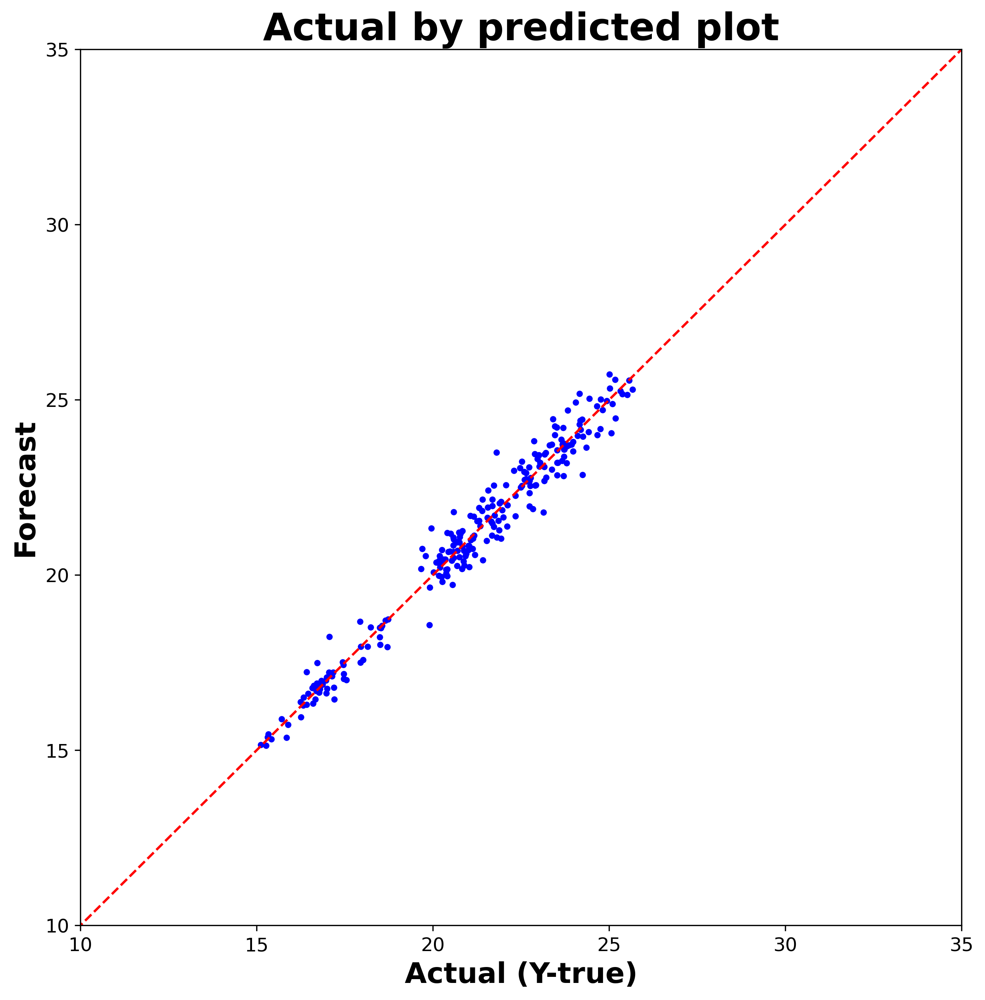

In [118]:
# Lock the scale of axis by Y_true
# max_value=100+5
# min_value=0-5
max_value=35
min_value=0

# Figure setting
plt.figure(figsize=(10,10),dpi=300)
plt.title('Actual by predicted plot',weight='bold',fontsize=24)
plt.xlabel('Actual (Y-true)',fontsize=18,weight='bold')
plt.ylabel('Forecast',fontsize=18,weight='bold')

# Perfect model reference line
plt.plot([min_value,max_value], [min_value,max_value], linestyle='--',color='red')

# Actual by predicted plot
plt.scatter(df2,LSTM_df1,marker='.',color='blue')

# Set the axis
plt.ylim(10,max_value)
plt.xlim(10,max_value)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

In [112]:
predicted_price
actual_price

MAE=mean_absolute_error(actual_price,predicted_price)
MSE=mean_squared_error(actual_price,predicted_price,squared=True)
RMSE=mean_squared_error(actual_price,predicted_price,squared=False)
# MAPE=mean_absolute_percentage_error(actual_price,predicted_price)
SMAPE=SMAPE_calulate(actual_price,predicted_price)
# RAE=RAE_calculate(actual_price,predicted_price)
# MRAE=MRAE_calculate(actual_price,predicted_price)
MdRAE=MdRAE_calculate(actual_price,predicted_price)
# RSE=RSE_calculate(actual_price,predicted_price,Root=False)
# RRSE=RSE_calculate(actual_price,predicted_price,Root=True)

print('MAE:',round(MAE,3))
print('MSE:',round(MSE,3))
print('RMSE:',round(RMSE,3))
# print('MAPE:',round(MAPE*100,3),'%')
print('SMAPE:',round(SMAPE,3),'%')
# print('RAE:',round(RAE,3))
# print('MRAE:',MRAE)
print('MdRAE:',round(MdRAE[0],3),'bench:',round(MdRAE[1],3))
# print('RSE:',round(RSE,3))
# print('RRSE:',round(RRSE,3))

MAE: 0.357
MSE: 0.224
RMSE: 0.473
SMAPE: 1.683 %
MdRAE: 0.176 bench: 21.004


# GRU

## Fit & compile the model

In [26]:
# 一層
keras.backend.clear_session()
model = keras.models.Sequential([
    GRU(64, input_shape=(X_train.shape[1], 1)),
    Dense(1)
])
opt=Adam(learning_rate=0.006,beta_1=0.95)
model.compile(loss='my_RMSE', optimizer=opt)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 64)                12864     
                                                                 
 dense (Dense)               (None, 1)                 65        
                                                                 
Total params: 12,929
Trainable params: 12,929
Non-trainable params: 0
_________________________________________________________________


In [62]:
# 兩層
keras.backend.clear_session()
model = Sequential()
model.add(GRU(64, return_sequences=True, input_shape=(X_train.shape[1],1)))
model.add(Dropout(0.2))
model.add(GRU(64))
model.add(Dense(units=1))
opt=Adam(learning_rate=0.006,beta_1=0.95)
model.compile(loss='my_RMSE', optimizer=opt)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 3, 64)             12864     
                                                                 
 dropout (Dropout)           (None, 3, 64)             0         
                                                                 
 gru_1 (GRU)                 (None, 64)                24960     
                                                                 
 dense (Dense)               (None, 1)                 65        
                                                                 
Total params: 37,889
Trainable params: 37,889
Non-trainable params: 0
_________________________________________________________________


In [58]:
# 三層
keras.backend.clear_session()
model = Sequential()
model.add(GRU(64, return_sequences=True, input_shape=(X_train.shape[1], 1)))
model.add(Dropout(0.2))
model.add(GRU(64, return_sequences=True))
model.add(Dropout(0.2))
model.add(GRU(64))
model.add(Dense(units=1))
opt = Adam(learning_rate=0.005, beta_1=0.9)
model.compile(loss='my_RMSE', optimizer=opt)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 3, 64)             12864     
                                                                 
 dropout (Dropout)           (None, 3, 64)             0         
                                                                 
 gru_1 (GRU)                 (None, 3, 64)             24960     
                                                                 
 dropout_1 (Dropout)         (None, 3, 64)             0         
                                                                 
 gru_2 (GRU)                 (None, 64)                24960     
                                                                 
 dense (Dense)               (None, 1)                 65        
                                                                 
Total params: 62,849
Trainable params: 62,849
Non-traina

In [63]:
history = model.fit(X_train, y_train, epochs = 100, batch_size = 64,validation_data=(X_val,y_val))

Epoch 1/100
13/13 [==============================] - 6s 163ms/step - loss: 0.1588 - val_loss: 0.1182
Epoch 2/100
13/13 [==============================] - 0s 14ms/step - loss: 0.0752 - val_loss: 0.0334
Epoch 3/100
13/13 [==============================] - 0s 15ms/step - loss: 0.0465 - val_loss: 0.0518
Epoch 4/100
13/13 [==============================] - 0s 14ms/step - loss: 0.0435 - val_loss: 0.0223
Epoch 5/100
13/13 [==============================] - 0s 15ms/step - loss: 0.0452 - val_loss: 0.0399
Epoch 6/100
13/13 [==============================] - 0s 14ms/step - loss: 0.0363 - val_loss: 0.0213
Epoch 7/100
13/13 [==============================] - 0s 15ms/step - loss: 0.0338 - val_loss: 0.0318
Epoch 8/100
13/13 [==============================] - 0s 15ms/step - loss: 0.0364 - val_loss: 0.0241
Epoch 9/100
13/13 [==============================] - 0s 14ms/step - loss: 0.0345 - val_loss: 0.0364
Epoch 10/100
13/13 [==============================] - 0s 15ms/step - loss: 0.0317 - val_loss: 0.022

In [64]:
modeling_result=history.history
modeling_result.keys()

dict_keys(['loss', 'val_loss'])

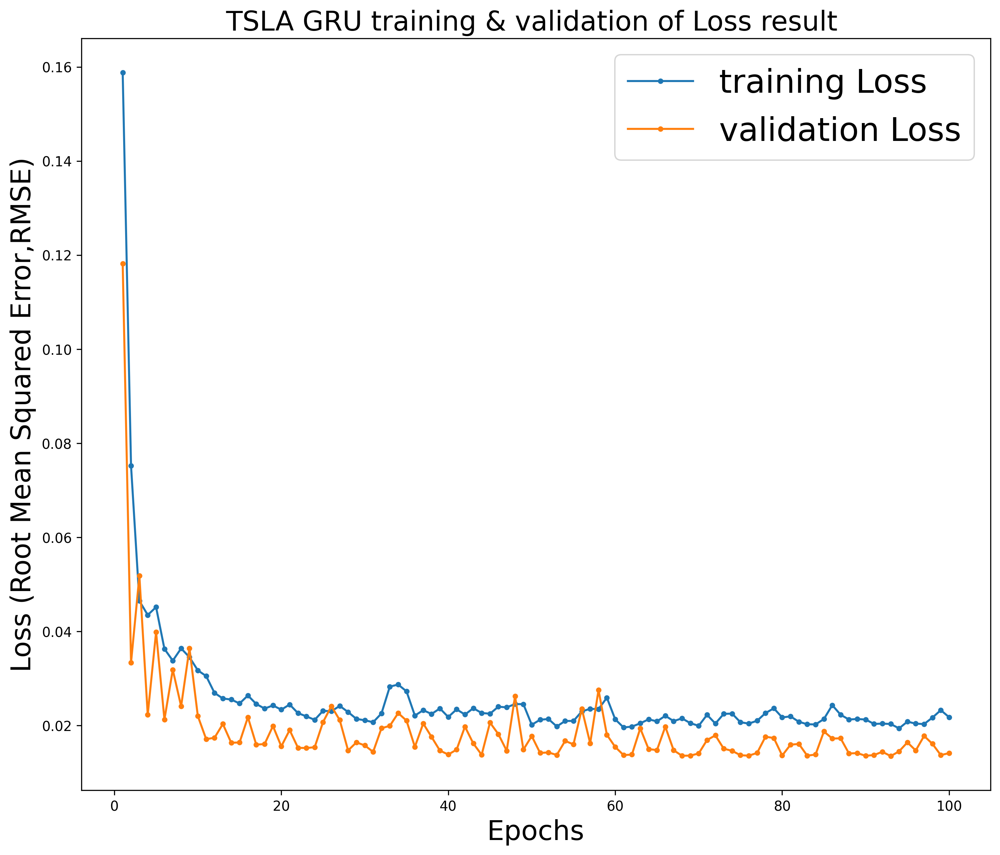

In [65]:
# Plot the history of training and validation
training_loss_values=modeling_result['loss']
val_loss_values=modeling_result['val_loss']
epochs=range(1,len(training_loss_values)+1)

plt.figure(figsize=(12,10),dpi=300)
plt.xlabel('Epochs',fontsize=20)
plt.ylabel('Loss (Root Mean Squared Error,RMSE)',fontsize=20)
plt.title('TSLA GRU training & validation of Loss result ',fontsize=20)

plt.plot(epochs, training_loss_values,marker='.',label='training Loss')
plt.plot(epochs, val_loss_values,marker='.',label='validation Loss')
plt.legend(loc=1,fontsize=24)
plt.show()

In [ ]:
model.save('RNN_GRU_trained_model1.h5')
print('Model has been saved...')

Model has been saved...


In [16]:
GRU_model=keras.models.load_model('/content/RNN_GRU_trained_model1.h5')
print('Model successfully loaded...')

Model successfully loaded...


## Testing

In [24]:
predicted_price = GRU_model.predict(X_test)
#使用sc的 inverse_transform將股價轉為歸一化前
predicted_price = sc.inverse_transform(predicted_price)
actual_price = sc.inverse_transform(y_test)

8/8 [==============================] - 1s 3ms/step


In [25]:
GRU_df1 = pd.DataFrame(predicted_price)
df2 = pd.DataFrame(actual_price)

GRU_df1.columns = ['Pred']
df2.columns = ['Actual']

merged_df = pd.concat([GRU_df1, df2], axis=1)
merged_df.to_csv('output2.csv', index=False)

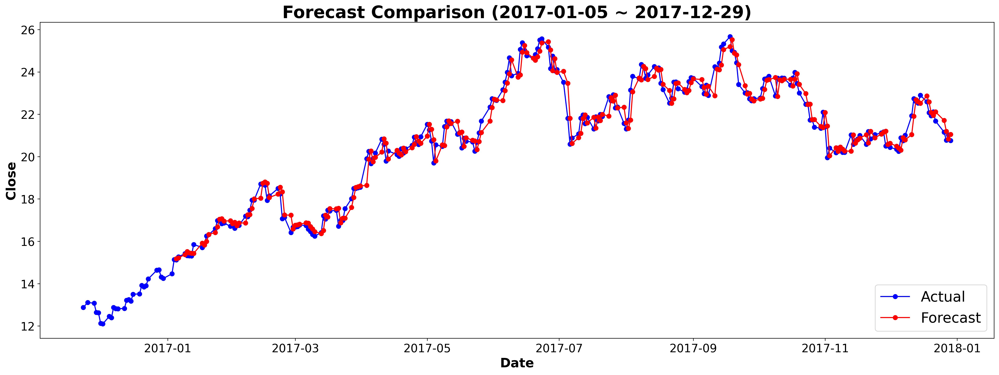

In [68]:
# Plot Y and its corresponding date
# Figure setting
plt.figure(figsize=(24,8),dpi=300)
plt.title('Forecast Comparison (2017-01-05 ~ 2017-12-29)',weight='bold',fontsize=24)
plt.xlabel('Date',fontsize=18,weight='bold')
plt.ylabel('Close',fontsize=18,weight='bold')

# Comparison of actual value and predicted value according to Date
plt.plot(data.iloc[982:,0],data.iloc[982:,1],marker='o',color='blue',label='Actual')
plt.plot(data.iloc[split+lags:,0],GRU_df1,marker='o',color='red',label='Forecast')

# Set the axis
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Set legends
plt.legend(loc=4,fontsize=20)

plt.show()

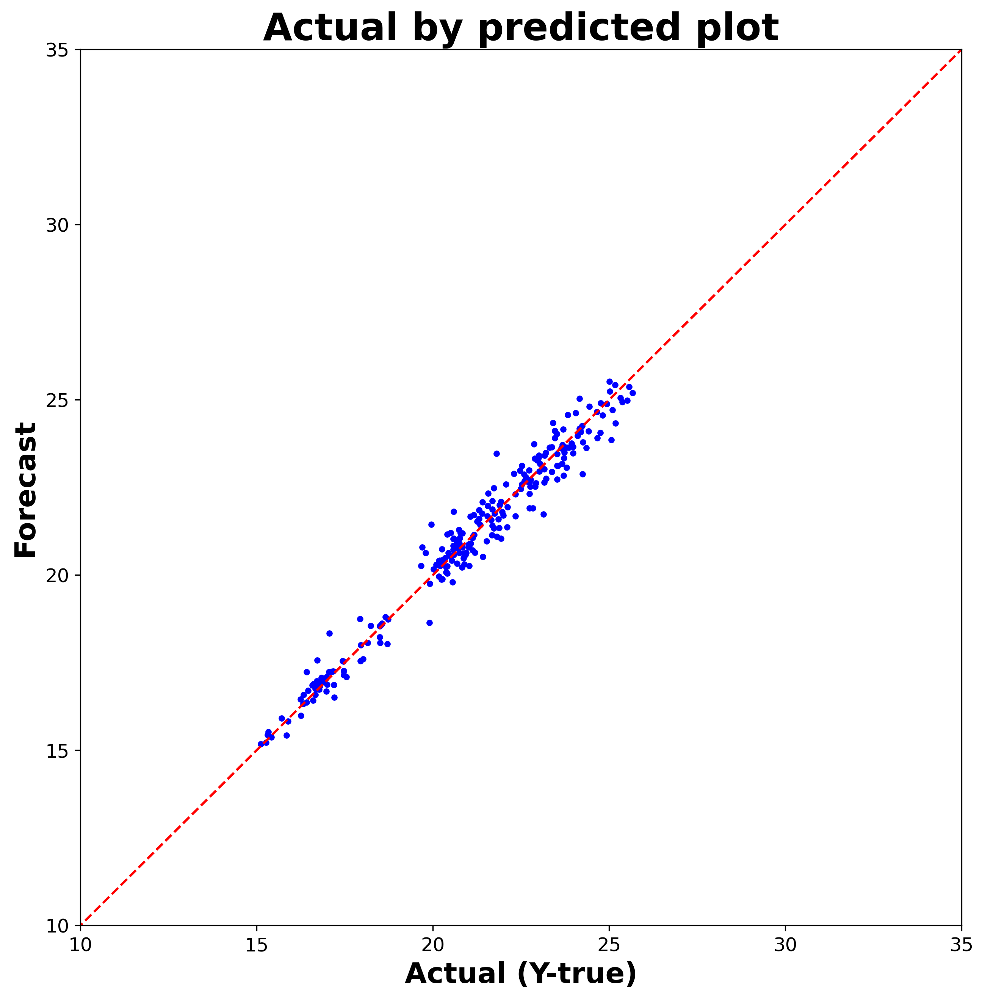

In [116]:
# Lock the scale of axis by Y_true
# max_value=100+5
# min_value=0-5
max_value=35
min_value=0

# Figure setting
plt.figure(figsize=(10,10),dpi=300)
plt.title('Actual by predicted plot',weight='bold',fontsize=24)
plt.xlabel('Actual (Y-true)',fontsize=18,weight='bold')
plt.ylabel('Forecast',fontsize=18,weight='bold')

# Perfect model reference line
plt.plot([min_value,max_value], [min_value,max_value], linestyle='--',color='red')

# Actual by predicted plot
plt.scatter(df2,GRU_df1,marker='.',color='blue')

# Set the axis
plt.ylim(10,max_value)
plt.xlim(10,max_value)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()


In [117]:
predicted_price
actual_price

MAE=mean_absolute_error(actual_price,predicted_price)
MSE=mean_squared_error(actual_price,predicted_price,squared=True)
RMSE=mean_squared_error(actual_price,predicted_price,squared=False)
# MAPE=mean_absolute_percentage_error(actual_price,predicted_price)
SMAPE=SMAPE_calulate(actual_price,predicted_price)
# RAE=RAE_calculate(actual_price,predicted_price)
# MRAE=MRAE_calculate(actual_price,predicted_price)
MdRAE=MdRAE_calculate(actual_price,predicted_price)
# RSE=RSE_calculate(actual_price,predicted_price,Root=False)
# RRSE=RSE_calculate(actual_price,predicted_price,Root=True)

print('MAE:',round(MAE,3))
print('MSE:',round(MSE,3))
print('RMSE:',round(RMSE,3))
# print('MAPE:',round(MAPE*100,3),'%')
print('SMAPE:',round(SMAPE,3),'%')
# print('RAE:',round(RAE,3))
# print('MRAE:',MRAE)
print('MdRAE:',round(MdRAE[0],3),'bench:',round(MdRAE[1],3))
# print('RSE:',round(RSE,3))
# print('RRSE:',round(RRSE,3))

MAE: 0.349
MSE: 0.216
RMSE: 0.465
SMAPE: 1.65 %
MdRAE: 0.173 bench: 21.004


## ----------------------------------------------------------------------------------------------------------------------------------------------------------------

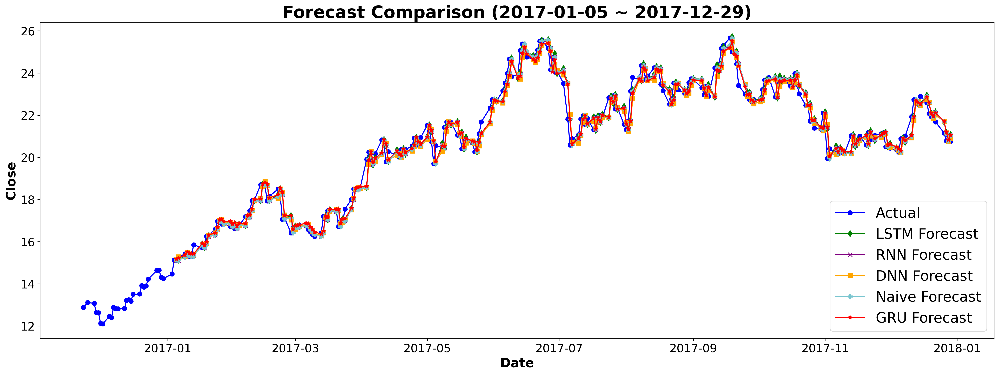

In [69]:
# Plot Y and its corresponding date
# Figure setting
plt.figure(figsize=(24,8),dpi=300)
plt.title('Forecast Comparison (2017-01-05 ~ 2017-12-29)',weight='bold',fontsize=24)
plt.xlabel('Date',fontsize=18,weight='bold')
plt.ylabel('Close',fontsize=18,weight='bold')

# Comparison of actual value and predicted value according to Date
plt.plot(data.iloc[982:,0],data.iloc[982:,1],marker='o',color='blue',label='Actual')
plt.plot(data.iloc[split+lags:,0],LSTM_df1,marker='d',color='green',label='LSTM Forecast')
plt.plot(data.iloc[split+lags:,0],RNN_df1,marker='x',color='purple',label='RNN Forecast')
plt.plot(data.iloc[split+lags:,0],DNN_df1,marker='s',color='orange',label='DNN Forecast')
plt.plot(data.iloc[split+lags:,0],Naive_df1,marker='P',color='#79C5CF',label='Naive Forecast')
plt.plot(data.iloc[split+lags:,0],GRU_df1,marker='*',color='red',label='GRU Forecast')

# Set the axis
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Set legends
plt.legend(loc=4,fontsize=20)


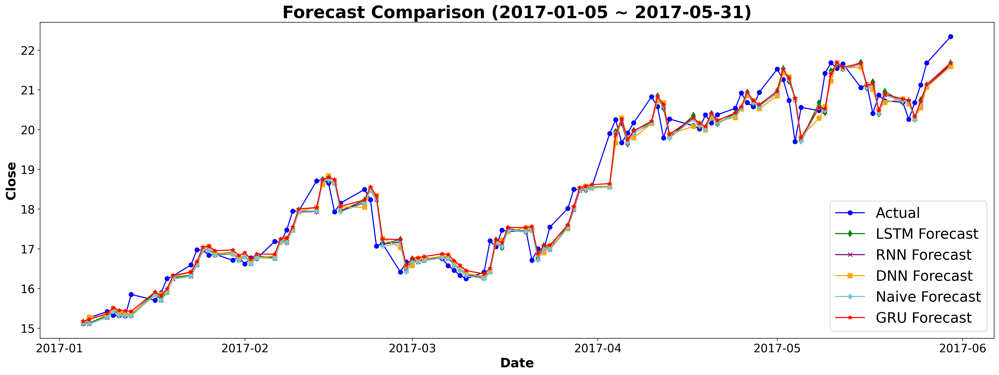

In [76]:
# Plot Y and its corresponding date
# Figure setting
plt.figure(figsize=(24,8),dpi=300)
plt.title('Forecast Comparison (2017-01-05 ~ 2017-05-31)',weight='bold',fontsize=24)
plt.xlabel('Date',fontsize=18,weight='bold')
plt.ylabel('Close',fontsize=18,weight='bold')

start = split+3
end = -149

# Comparison of actual value and predicted value according to Date
plt.plot(data.iloc[start:end,0],data.iloc[start:end,1],marker='o',color='blue',label='Actual')
plt.plot(data.iloc[start:end,0],LSTM_df1[:end],marker='d',color='green',label='LSTM Forecast')
plt.plot(data.iloc[start:end,0],RNN_df1[:end],marker='x',color='purple',label='RNN Forecast')
plt.plot(data.iloc[start:end,0],DNN_df1[:end],marker='s',color='orange',label='DNN Forecast')
plt.plot(data.iloc[start:end,0],Naive_df1[:end],marker='P',color='#79C5CF',label='Naive Forecast')
plt.plot(data.iloc[start:end,0],GRU_df1[:end],marker='*',color='red',label='GRU Forecast')

# Set the axis
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Set legends
plt.legend(loc=4,fontsize=20)

### ----------------------------------------------------------------------------------------------------------------------------------------------------------------

In [35]:
Test = pd.read_csv('/content/TSLA3.csv')
Test['Date']=pd.to_datetime(Test.iloc[:,0])
Test.rename(columns={'Close': 'Y'}, inplace=True)
Test = Test.iloc[:,[0,4]]
Test

,Date,Y
0,2018-01-02,21.368668
1,2018-01-03,21.150000
2,2018-01-04,20.974667
3,2018-01-05,21.105333
4,2018-01-08,22.427334
...,...,...
750,2020-12-23,215.326660
751,2020-12-24,220.589996
752,2020-12-28,221.229996
753,2020-12-29,221.996674


In [36]:
Test.describe()

,Y
count,755.000000
mean,45.200207
std,48.397358
min,11.931333
25%,18.944000
50%,22.271334
75%,49.901001
max,231.666672


In [37]:
test_set = Test['Y'].values.reshape(-1,1)
test_set_scaled = sc.transform(test_set)

X_test = []
y_test = []
for i in range(lags,len(test_set)):
    X_test.append(test_set_scaled[i-3:i])
    y_test.append(test_set_scaled[i])
X_test, y_test = np.array(X_test), np.array(y_test)
X_test = np.reshape(X_test,(X_test.shape[0], X_test.shape[1], 1))

In [38]:
predicted_price = GRU_model.predict(X_test)
#使用sc的 inverse_transform將股價轉為歸一化前
predicted_price = sc.inverse_transform(predicted_price)
actual_price = sc.inverse_transform(y_test)

24/24 [==============================] - 0s 3ms/step


In [39]:
GRU_df1 = pd.DataFrame(predicted_price)
df2 = pd.DataFrame(actual_price)

GRU_df1.columns = ['Pred']
df2.columns = ['Actual']

merged_df = pd.concat([GRU_df1, df2], axis=1)
merged_df.to_csv('output.csv', index=False)
GRU_df1

,Pred
0,21.018860
1,21.136341
2,22.371136
3,22.235846
4,22.316912
...,...
747,58.621048
748,58.690208
749,58.606094
750,58.555485


### 預測後一年

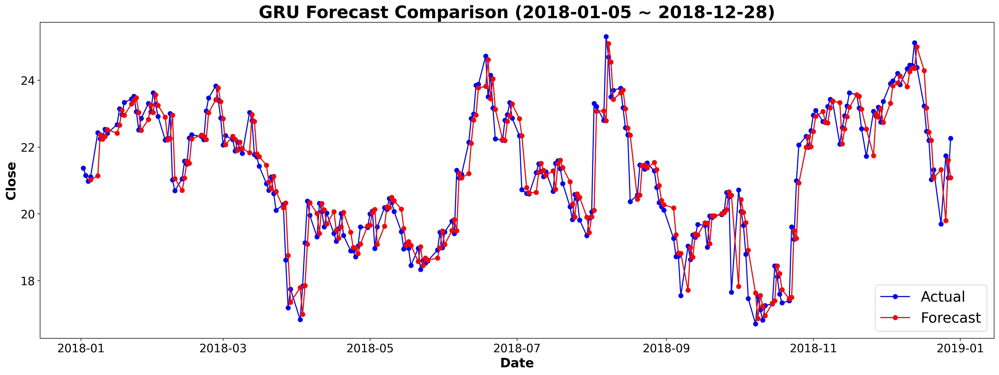

In [22]:
# Plot Y and its corresponding date
# Figure setting
plt.figure(figsize=(24,8),dpi=300)
plt.title('GRU Forecast Comparison (2018-01-05 ~ 2018-12-28)',weight='bold',fontsize=24)
plt.xlabel('Date',fontsize=18,weight='bold')
plt.ylabel('Close',fontsize=18,weight='bold')

# Comparison of actual value and predicted value according to Date
# plt.plot(data.iloc[982:,0],data.iloc[982:,1],marker='o',color='blue',label='Actual')
# plt.plot(data.iloc[split+lags:,0],df1,marker='o',color='red',label='Forecast')

plt.plot(Test.iloc[:,0],Test.iloc[:,1],marker='o',color='blue',label='Actual')
plt.plot(Test.iloc[lags:,0],GRU_df1,marker='o',color='red',label='Forecast')

# Set the axis
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Set legends
plt.legend(loc=4,fontsize=20)

plt.show()

In [23]:
predicted_price
actual_price

MAE=mean_absolute_error(actual_price,predicted_price)
MSE=mean_squared_error(actual_price,predicted_price,squared=True)
RMSE=mean_squared_error(actual_price,predicted_price,squared=False)
# MAPE=mean_absolute_percentage_error(actual_price,predicted_price)
SMAPE=SMAPE_calulate(actual_price,predicted_price)
# RAE=RAE_calculate(actual_price,predicted_price)
# MRAE=MRAE_calculate(actual_price,predicted_price)
MdRAE=MdRAE_calculate(actual_price,predicted_price)
 # RSE=RSE_calculate(actual_price,predicted_price,Root=False)
# RRSE=RSE_calculate(actual_price,predicted_price,Root=True)

print('MAE:',round(MAE,3))
print('MSE:',round(MSE,3))
print('RMSE:',round(RMSE,3))
# print('MAPE:',round(MAPE*100,3),'%')
print('SMAPE:',round(SMAPE,3),'%')
# print('RAE:',round(RAE,3))
# print('MRAE:',MRAE)
print('MdRAE:',round(MdRAE[0],3),'bench:',round(MdRAE[1],3))
# print('RSE:',round(RSE,3))
# print('RRSE:',round(RRSE,3))

MAE: 0.533
MSE: 0.549
RMSE: 0.741
SMAPE: 2.561 %
MdRAE: 0.255 bench: 21.15


In [24]:
# Naive
predicted_price = Test['Y'][lags-1:-1].values.reshape(-1,1)
actual_price = Test['Y'][lags:].values.reshape(-1,1)
# actual_price = sc.inverse_transform(y_test)

MAE=mean_absolute_error(actual_price,predicted_price)
MSE=mean_squared_error(actual_price,predicted_price,squared=True)
RMSE=mean_squared_error(actual_price,predicted_price,squared=False)
SMAPE=SMAPE_calulate(actual_price,predicted_price)
MdRAE=MdRAE_calculate(actual_price,predicted_price)

print('MAE:',round(MAE,3))
print('MSE:',round(MSE,3))
print('RMSE:',round(RMSE,3))
print('SMAPE:',round(SMAPE,3),'%')
print('MdRAE:',round(MdRAE[0],3),'bench:',round(MdRAE[1],3))

MAE: 0.539
MSE: 0.565
RMSE: 0.751
SMAPE: 2.593 %
MdRAE: 0.258 bench: 21.15


In [25]:
# Naive
df1 = pd.DataFrame(predicted_price)
df2 = pd.DataFrame(actual_price)

df1.columns = ['Pred']
df2.columns = ['Actual']

merged_df = pd.concat([df1, df2], axis=1)
merged_df.to_csv('Naive_output.csv', index=False)

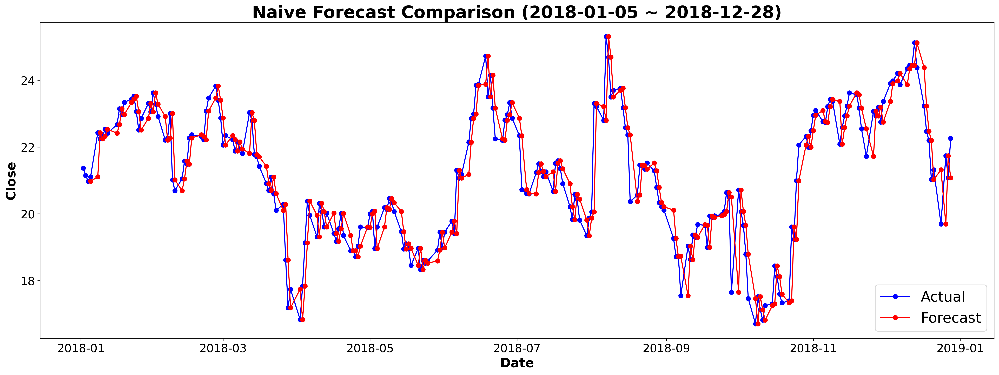

In [33]:
# Naive
# Plot Y and its corresponding date
# Figure setting
plt.figure(figsize=(24,8),dpi=300)
plt.title('Naive Forecast Comparison (2018-01-05 ~ 2018-12-28)',weight='bold',fontsize=24)
plt.xlabel('Date',fontsize=18,weight='bold')
plt.ylabel('Close',fontsize=18,weight='bold')

# Comparison of actual value and predicted value according to Date
plt.plot(Test.iloc[:,0],Test.iloc[:,1],marker='o',color='blue',label='Actual')
plt.plot(Test.iloc[lags:,0],df1,marker='o',color='red',label='Forecast')

# Set the axis
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Set legends
plt.legend(loc=4,fontsize=20)

plt.show()

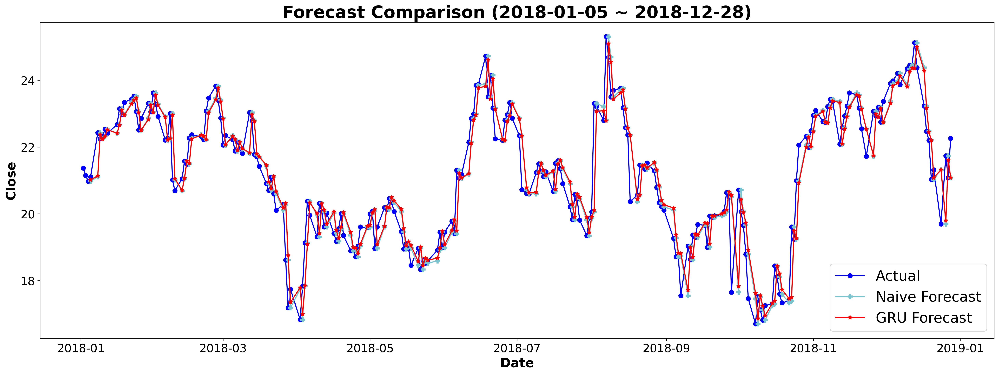

In [34]:
# Plot Y and its corresponding date
# Figure setting
plt.figure(figsize=(24,8),dpi=300)
plt.title('Forecast Comparison (2018-01-05 ~ 2018-12-28)',weight='bold',fontsize=24)
plt.xlabel('Date',fontsize=18,weight='bold')
plt.ylabel('Close',fontsize=18,weight='bold')

# Comparison of actual value and predicted value according to Date
plt.plot(Test.iloc[:,0],Test.iloc[:,1],marker='o',color='blue',label='Actual')
plt.plot(Test.iloc[lags:,0],df1,marker='P',color='#79C5CF',label='Naive Forecast')
plt.plot(Test.iloc[lags:,0],GRU_df1,marker='*',color='red',label='GRU Forecast')

# Set the axis
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Set legends
plt.legend(loc=4,fontsize=20)

plt.show()

### 預測後三年

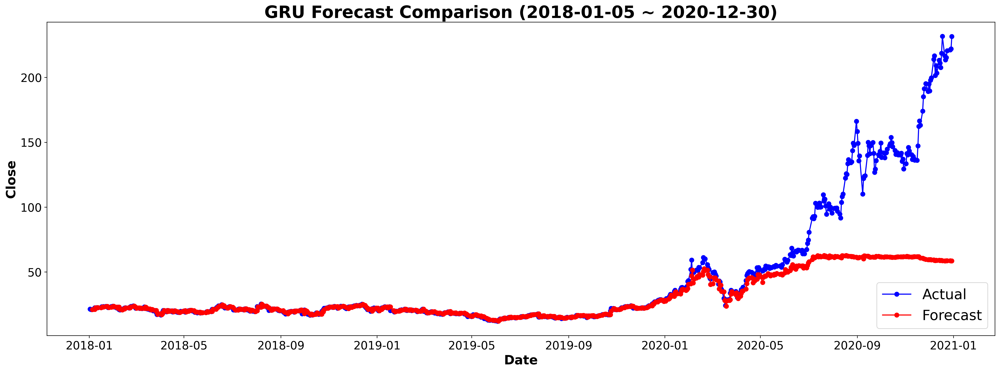

In [40]:
# Plot Y and its corresponding date
# Figure setting
plt.figure(figsize=(24,8),dpi=300)
plt.title('GRU Forecast Comparison (2018-01-05 ~ 2020-12-30)',weight='bold',fontsize=24)
plt.xlabel('Date',fontsize=18,weight='bold')
plt.ylabel('Close',fontsize=18,weight='bold')

# Comparison of actual value and predicted value according to Date
plt.plot(Test.iloc[:,0],Test.iloc[:,1],marker='o',color='blue',label='Actual')
plt.plot(Test.iloc[lags:,0],GRU_df1,marker='o',color='red',label='Forecast')

# Set the axis
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Set legends
plt.legend(loc=4,fontsize=20)

plt.show()

In [41]:
predicted_price
actual_price

MAE=mean_absolute_error(actual_price,predicted_price)
MSE=mean_squared_error(actual_price,predicted_price,squared=True)
RMSE=mean_squared_error(actual_price,predicted_price,squared=False)
# MAPE=mean_absolute_percentage_error(actual_price,predicted_price)
SMAPE=SMAPE_calulate(actual_price,predicted_price)
# RAE=RAE_calculate(actual_price,predicted_price)
# MRAE=MRAE_calculate(actual_price,predicted_price)
MdRAE=MdRAE_calculate(actual_price,predicted_price)
 # RSE=RSE_calculate(actual_price,predicted_price,Root=False)
# RRSE=RSE_calculate(actual_price,predicted_price,Root=True)

print('MAE:',round(MAE,3))
print('MSE:',round(MSE,3))
print('RMSE:',round(RMSE,3))
# print('MAPE:',round(MAPE*100,3),'%')
print('SMAPE:',round(SMAPE,3),'%')
# print('RAE:',round(RAE,3))
# print('MRAE:',MRAE)
print('MdRAE:',round(MdRAE[0],3),'bench:',round(MdRAE[1],3))
# print('RSE:',round(RSE,3))
# print('RRSE:',round(RRSE,3))

MAE: 15.155
MSE: 1415.954
RMSE: 37.629
SMAPE: 16.342 %
MdRAE: 0.024 bench: 45.296


In [42]:
# Naive
predicted_price = Test['Y'][lags-1:-1].values.reshape(-1,1)
actual_price = Test['Y'][lags:].values.reshape(-1,1)
# actual_price = sc.inverse_transform(y_test)

MAE=mean_absolute_error(actual_price,predicted_price)
MSE=mean_squared_error(actual_price,predicted_price,squared=True)
RMSE=mean_squared_error(actual_price,predicted_price,squared=False)
SMAPE=SMAPE_calulate(actual_price,predicted_price)
MdRAE=MdRAE_calculate(actual_price,predicted_price)

print('MAE:',round(MAE,3))
print('MSE:',round(MSE,3))
print('RMSE:',round(RMSE,3))
print('SMAPE:',round(SMAPE,3),'%')
print('MdRAE:',round(MdRAE[0],3),'bench:',round(MdRAE[1],3))

MAE: 1.522
MSE: 9.973
RMSE: 3.158
SMAPE: 2.925 %
MdRAE: 0.02 bench: 45.296


In [43]:
# Naive
df1 = pd.DataFrame(predicted_price)
df2 = pd.DataFrame(actual_price)

df1.columns = ['Pred']
df2.columns = ['Actual']

merged_df = pd.concat([df1, df2], axis=1)
merged_df.to_csv('Naive_output.csv', index=False)

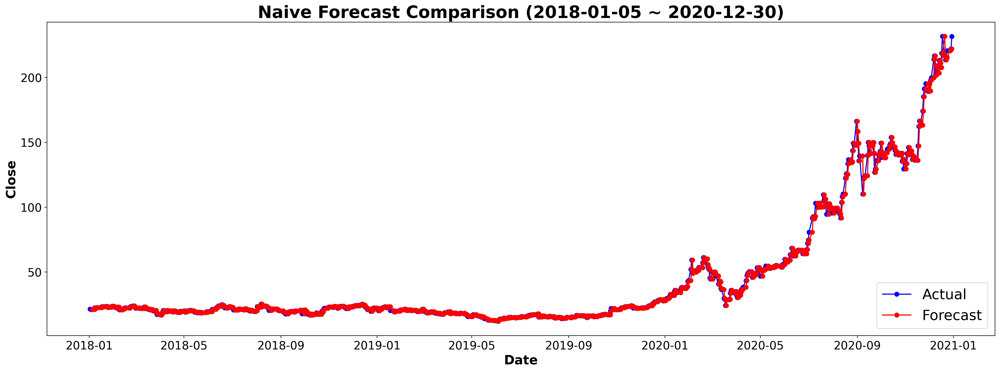

In [44]:
# Naive
# Plot Y and its corresponding date
# Figure setting
plt.figure(figsize=(24,8),dpi=300)
plt.title('Naive Forecast Comparison (2018-01-05 ~ 2020-12-30)',weight='bold',fontsize=24)
plt.xlabel('Date',fontsize=18,weight='bold')
plt.ylabel('Close',fontsize=18,weight='bold')

# Comparison of actual value and predicted value according to Date
plt.plot(Test.iloc[:,0],Test.iloc[:,1],marker='o',color='blue',label='Actual')
plt.plot(Test.iloc[lags:,0],df1,marker='o',color='red',label='Forecast')

# Set the axis
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Set legends
plt.legend(loc=4,fontsize=20)

plt.show()

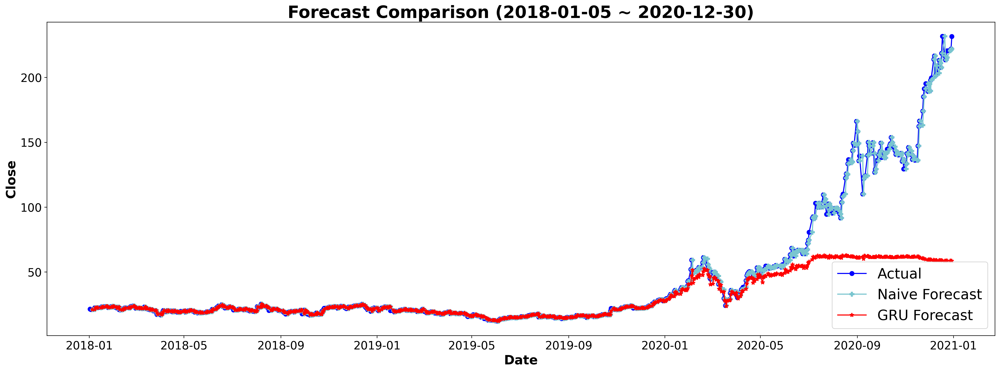

In [46]:
# Plot Y and its corresponding date
# Figure setting
plt.figure(figsize=(24,8),dpi=300)
plt.title('Forecast Comparison (2018-01-05 ~ 2020-12-30)',weight='bold',fontsize=24)
plt.xlabel('Date',fontsize=18,weight='bold')
plt.ylabel('Close',fontsize=18,weight='bold')

# Comparison of actual value and predicted value according to Date
plt.plot(Test.iloc[:,0],Test.iloc[:,1],marker='o',color='blue',label='Actual')
plt.plot(Test.iloc[lags:,0],df1,marker='P',color='#79C5CF',label='Naive Forecast')
plt.plot(Test.iloc[lags:,0],GRU_df1,marker='*',color='red',label='GRU Forecast')

# Set the axis
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Set legends
plt.legend(loc=4,fontsize=20)

plt.show()